<div class="usecase-title"> Identifying Top Five Business Establishment Hotspots in Melbourne</div>

<div class="usecase-authors"><b>Authored by: </b> Jnaneshwari Beerappa</div>

<div class="usecase-duration"><b>Duration:</b> {90} mins</div>

<div class="usecase-level-skill">
    <div class="usecase-level"><b>Level: </b>{Intermediate}</div>
    <div class="usecase-skill"><b>Pre-requisite Skills: </b>Python, Data Analysis, Visualization, Basic Knowledge of Geospatial Data</div>
</div>

<div class="usecase-section-header">Scenario</div>

Scenario
User Story: As a city planner for Melbourne, I need to identify the top five hotspots for business establishments within the city so that I can better allocate resources, plan infrastructure, and support local economic development.

* Economic Growth: Target areas with high potential for business development.  
* Data Utilization: Leverage business establishment data for informed decision-making.  



<div class="usecase-section-header">What this use case will teach you</div>

At the end of this use case, we will be able to :
- To Understand how to process and analyze geospatial data
Learn how to use Python libraries like Pandas, Geopandas, and Matplotlib for data analysis and visualization
Be able to identify key business hotspots using clustering techniques
Gain experience in presenting data-driven insights for urban planning

<div class="usecase-section-header">Introduction to the Problem</div>

In this use case, I focused on identifying the top five hotspots for business establishments in Melbourne. The rationale behind solving this problem is to help city planners and stakeholders make informed decisions about where to focus resources for infrastructure development, public services, and economic support. By analyzing the distribution of business establishments across the city, we can uncover patterns and trends that are crucial for effective urban planning.

The dataset used for this analysis includes business establishment records for Melbourne, which contains information such as location coordinates, business types, and establishment density. The data was sourced from the City of Melbourne's open data portal and further cleaned and processed to ensure accuracy and relevance for this analysis.



In [ ]:
import requests
import pandas as pd
from io import StringIO

# Function to collect data
def collect_data(dataset_id):
    base_url = 'https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
    #apikey = "" # use if datasets require API key permissions
    dataset_id = dataset_id
    format = 'csv'

    url = f'{base_url}{dataset_id}/exports/{format}'
    params = {
        'select': '*',
        'limit': -1,  # all records
        'lang': 'en',
        'timezone': 'UTC',
        # 'api_key': apikey
    }

    # GET request
    response = requests.get(url, params=params)

    if response.status_code == 200:
        # StringIO to read the CSV data
        url_content = response.content.decode('utf-8')
        dataset = pd.read_csv(StringIO(url_content), delimiter=';')
        return dataset
    else:
        print(f'Request failed with status code {response.status_code}')

# Set dataset_id to query for the API call
dataset_id = 'business-establishments-with-address-and-industry-classification'

# Save dataset to df variable
df = collect_data(dataset_id)

# Check number of records in df
print(f'The dataset contains {len(df)} records.')

# View df
df.head(5)


The dataset contains 374210 records.


,census_year,block_id,property_id,base_property_id,clue_small_area,trading_name,business_address,industry_anzsic4_code,industry_anzsic4_description,longitude,latitude
0,2003,105,100172,100172,Melbourne (CBD),Wilson Parking Australia,24-46 A'Beckett Street MELBOURNE 3000,9533,Parking Services,144.962053,-37.808573
1,2003,105,103301,103301,Melbourne (CBD),Melbourne International Backpackers,442-450 Elizabeth Street MELBOURNE 3000,4400,Accommodation,144.960868,-37.808309
2,2003,105,103302,103302,Melbourne (CBD),Vacant,422-440 Elizabeth Street MELBOURNE 3000,0,Vacant Space,144.961017,-37.808630
3,2003,105,103302,103302,Melbourne (CBD),The Garden Cafe,"Shop 3, Ground , 422-440 Elizabeth Street MELB...",4511,Cafes and Restaurants,144.961017,-37.808630
4,2003,105,103302,103302,Melbourne (CBD),Telephony Australia,"Shop 5, Ground , 422-440 Elizabeth Street MELB...",5809,Other Telecommunications Services,144.961017,-37.808630


<p class="usecase-subsection-header">Step 3: Check for Missing Values in Latitude and Longitude Columns</p>
Below is a Python script that checks for missing values in the latitude and longitude columns of the dataset:



In [ ]:
# Check for missing values in latitude and longitude columns
missing_latitude = df['latitude'].isnull().sum()
missing_longitude = df['longitude'].isnull().sum()

print(f"Missing values in 'latitude': {missing_latitude}")
print(f"Missing values in 'longitude': {missing_longitude}")


Missing values in 'latitude': 4785
Missing values in 'longitude': 4785


<p class="usecase-subsection-header">Step 4: Clean the Dataset by Dropping Rows with Missing Values</p>

In [ ]:
# Drop rows with missing latitude or longitude values
df_cleaned = df.dropna(subset=['latitude', 'longitude'])

# Confirm that there are no missing values left
missing_latitude_cleaned = df_cleaned['latitude'].isnull().sum()
missing_longitude_cleaned = df_cleaned['longitude'].isnull().sum()

print(f"Missing values after cleaning in 'latitude': {missing_latitude_cleaned}")
print(f"Missing values after cleaning in 'longitude': {missing_longitude_cleaned}")


Missing values after cleaning in 'latitude': 0
Missing values after cleaning in 'longitude': 0


<p class="usecase-subsection-header">Step 5: Ensure Latitude and Longitude Columns are Numeric</p>

In [ ]:
# Ensure the latitude and longitude are numeric using .loc to avoid SettingWithCopyWarning
df_cleaned.loc[:, 'latitude'] = pd.to_numeric(df_cleaned['latitude'], errors='coerce')
df_cleaned.loc[:, 'longitude'] = pd.to_numeric(df_cleaned['longitude'], errors='coerce')

# Check the data types to confirm
print(df_cleaned[['latitude', 'longitude']].dtypes)


latitude     float64
longitude    float64
dtype: object


<p class="usecase-subsection-header">Step 6: Apply K-Means Clustering to Identify Business Hotspots</p>

In [ ]:
from sklearn.cluster import KMeans

# Extract the latitude and longitude columns for clustering
locations = df_cleaned[['latitude', 'longitude']]

# Apply K-Means clustering to identify 5 clusters (hotspots)
kmeans = KMeans(n_clusters=5, random_state=0)
df_cleaned['cluster'] = kmeans.fit_predict(locations)

# Count the number of businesses in each cluster
cluster_counts = df_cleaned['cluster'].value_counts().sort_values(ascending=False)

# Display the top 5 clusters
print(cluster_counts.head(5))


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


cluster
0    156255
4    124877
3     56994
1     19448
2     11851
Name: count, dtype: int64


<ipython-input-5-8a629c4bb00c>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['cluster'] = kmeans.fit_predict(locations)


<p class="usecase-subsection-header">Step 7: Retrieve Centroid Coordinates of Top 5 Hotspots</p>

In [ ]:
# Get the centroid coordinates of the top 5 clusters
top_clusters = cluster_counts.index[:5]
centroids = kmeans.cluster_centers_[top_clusters]

# Display the centroids of the top 5 hotspots
for i, centroid in enumerate(centroids):
    print(f"Hotspot {i+1}: Latitude {centroid[0]}, Longitude {centroid[1]}")


Hotspot 1: Latitude -37.81649338709314, Longitude 144.9593746816832
Hotspot 2: Latitude -37.81027385193321, Longitude 144.96895152469776
Hotspot 3: Latitude -37.80272317246289, Longitude 144.9454911043396
Hotspot 4: Latitude -37.81482455911137, Longitude 144.91942891148435
Hotspot 5: Latitude -37.83819289766458, Longitude 144.97715040816652


<p class="usecase-subsection-header">Step 8: Visualize Hotspots on a Map Using Folium (Dynamic Centroid Extraction)</p>

In [ ]:
import folium
from sklearn.cluster import KMeans

# Assuming you have already obtained the cleaned dataframe 'df_cleaned'
# Extract the latitude and longitude columns for clustering
locations = df_cleaned[['latitude', 'longitude']]

# Apply K-Means clustering to identify 5 clusters (hotspots)
kmeans = KMeans(n_clusters=5, random_state=0)
df_cleaned['cluster'] = kmeans.fit_predict(locations)

# Extract the centroid coordinates from the K-Means clustering result
centroids = kmeans.cluster_centers_

# Create a base map centered around Melbourne
melbourne_map = folium.Map(location=[-37.8136, 144.9631], zoom_start=13)

# Add markers for each hotspot centroid
for i, centroid in enumerate(centroids):
    folium.Marker(
        location=[centroid[0], centroid[1]],  # The latitude and longitude of the centroid
        popup=f"Hotspot {i+1}",  # Popup label for the marker
        icon=folium.Icon(color="red", icon="info-sign"),  # Custom icon for the marker
    ).add_to(melbourne_map)

# Save the map to an HTML file
melbourne_map.save("melbourne_hotspots_map.html")

# If running in a Jupyter notebook, you can display the map directly
melbourne_map


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
<ipython-input-8-0e453f57c009>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['cluster'] = kmeans.fit_predict(locations)


<p class="usecase-subsection-header">Objective: Analyze Existing Business Activity Based on Number of Businesses</p> <p class="usecase-subsection-blurb">The following analysis focuses on assessing the current business activity in Melbourne by evaluating the number of businesses operating in various sectors. This analysis will help identify which sectors have the highest concentration of businesses, providing insights into the city’s economic landscape.</p>

<p class="usecase-subsection-header">Step 9: Data Inspection and Cleaning</p>

In [ ]:
# Inspect column names
print(df.columns)

# Check for missing values
df.isnull().sum()

# Fill missing values or drop rows/columns as necessary
df = df.dropna()  # Example: Dropping rows with missing values

# Verify the data is clean
df.head()


Index(['census_year', 'block_id', 'property_id', 'base_property_id',
       'clue_small_area', 'trading_name', 'business_address',
       'industry_anzsic4_code', 'industry_anzsic4_description', 'longitude',
       'latitude'],
      dtype='object')


,census_year,block_id,property_id,base_property_id,clue_small_area,trading_name,business_address,industry_anzsic4_code,industry_anzsic4_description,longitude,latitude
0,2003,105,100172,100172,Melbourne (CBD),Wilson Parking Australia,24-46 A'Beckett Street MELBOURNE 3000,9533,Parking Services,144.962053,-37.808573
1,2003,105,103301,103301,Melbourne (CBD),Melbourne International Backpackers,442-450 Elizabeth Street MELBOURNE 3000,4400,Accommodation,144.960868,-37.808309
2,2003,105,103302,103302,Melbourne (CBD),Vacant,422-440 Elizabeth Street MELBOURNE 3000,0,Vacant Space,144.961017,-37.808630
3,2003,105,103302,103302,Melbourne (CBD),The Garden Cafe,"Shop 3, Ground , 422-440 Elizabeth Street MELB...",4511,Cafes and Restaurants,144.961017,-37.808630
4,2003,105,103302,103302,Melbourne (CBD),Telephony Australia,"Shop 5, Ground , 422-440 Elizabeth Street MELB...",5809,Other Telecommunications Services,144.961017,-37.808630


<p class="usecase-subsection-header">Step 10: Analysis of Business Activity by Industry Classification</p>

In [ ]:
# Analysis: Number of businesses by industry classification
industry_column = 'industry_anzsic4_description'
industry_counts = df[industry_column].value_counts()
print(industry_counts)


industry_anzsic4_description
Vacant Space                                                       56221
Cafes and Restaurants                                              29373
Legal Services                                                     13371
Takeaway Food Services                                             11185
Computer System Design and Related Services                         9456
                                                                   ...  
Leather Tanning, Fur Dressing and Leather Product Manufacturing        2
Other Basic Polymer Manufacturing                                      2
Veterinary Pharmaceutical and Medicinal Product Manufacturing          2
Beef Cattle Farming (Specialised)                                      1
Other Basic Chemical Product Manufacturing n.e.c.                      1
Name: count, Length: 441, dtype: int64


<p class="usecase-subsection-header">Step 13: Analyze Top 10 Business Types in Dynamic Hotspots</p>

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans

# Assuming df_cleaned is your cleaned DataFrame with all necessary columns

# Extract the latitude and longitude columns for clustering
locations = df_cleaned[['latitude', 'longitude']]

# Apply K-Means clustering to identify 5 clusters (hotspots)
kmeans = KMeans(n_clusters=5, random_state=0)
df_cleaned['cluster'] = kmeans.fit_predict(locations)

# Extract the centroid coordinates from the K-Means clustering result
centroids = kmeans.cluster_centers_

# Define a small radius to filter businesses around each centroid (e.g., 0.01 degrees)
radius = 0.01

# Filter businesses within the top 5 hotspots
hotspot_businesses = pd.DataFrame()

for centroid in centroids:
    lat, lon = centroid
    filtered_df = df_cleaned[
        (df_cleaned['latitude'].between(lat - radius, lat + radius)) &
        (df_cleaned['longitude'].between(lon - radius, lon + radius))
    ]
    hotspot_businesses = pd.concat([hotspot_businesses, filtered_df])

# Group by industry classification and count the number of businesses
industry_distribution = hotspot_businesses.groupby('industry_anzsic4_description').size()

# Sort by the number of businesses and get the top 10
top_10_industries = industry_distribution.sort_values(ascending=False).head(10)

# Display the top 10 business types
print("Top 10 Business Types for Establishment in Top 5 Hotspots:")
print(top_10_industries)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Top 10 Business Types for Establishment in Top 5 Hotspots:
industry_anzsic4_description
Vacant Space                                       61647
Cafes and Restaurants                              35938
Legal Services                                     20019
Takeaway Food Services                             14828
Other Auxiliary Finance and Investment Services    13054
Computer System Design and Related Services        12332
Management Advice and Other Consulting Services    11873
Hairdressing and Beauty Services                    8750
Clothing Retailing                                  8426
Womens Clothing Retailing                           7991
dtype: int64


<p class="usecase-subsection-header">Step 14: Visualize Top 10 Business Types with a Horizontal Bar Chart</p>

<ipython-input-13-85577e565a77>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


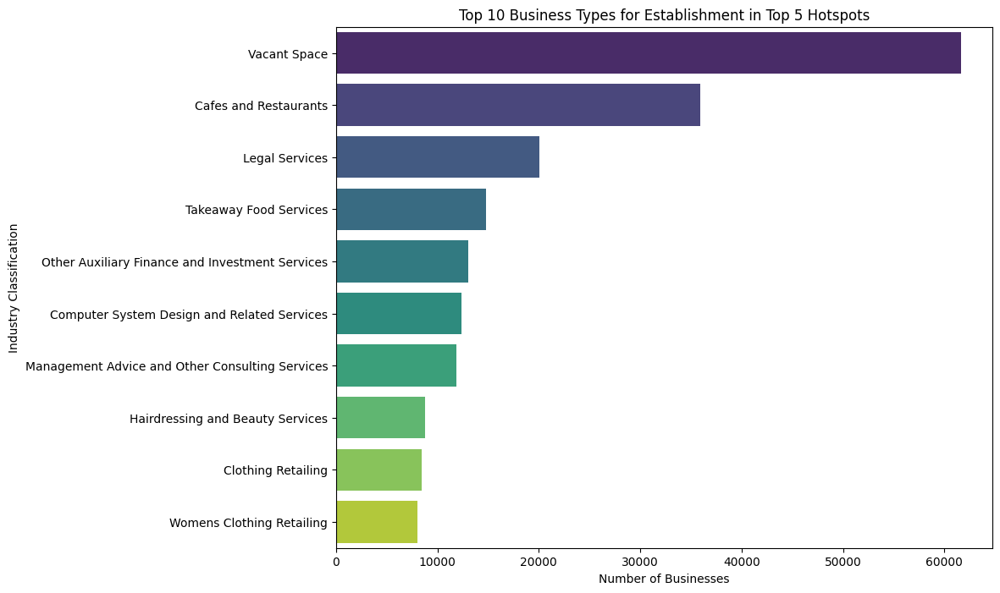

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the horizontal bar chart with color coding
plt.figure(figsize=(10, 8))
sns.barplot(
    x=top_10_industries.values,
    y=top_10_industries.index,
    palette='viridis'
)
plt.title('Top 10 Business Types for Establishment in Top 5 Hotspots')
plt.xlabel('Number of Businesses')
plt.ylabel('Industry Classification')
plt.show()


<p class="usecase-subsection-header">Step 15: Predicting Success Rate for New Businesses in Top 10 Industries within Top 5 Hotspots</p> <p class="usecase-subsection-blurb">This section describes how to develop a predictive model to estimate the success rate for starting a new business in one of the top 10 business activities within the top 5 hotspots identified in Melbourne.</p> <p class="usecase-subsection-header">1. Define Success Criteria</p> <p class="usecase-subsection-blurb"> - <strong>Longevity-Based Success:</strong> A business could be considered successful if it has been operational for a certain number of years (e.g., 2 years or more).<br> - <strong>Revenue-Based Success:</strong> If revenue data is available, success can be defined by meeting a certain revenue threshold. </p> <p class="usecase-subsection-header">2. Feature Engineering</p> <p class="usecase-subsection-blurb"> - <strong>Industry Classification:</strong> Include the business industry as a categorical feature.<br> - <strong>Location (Hotspot):</strong> Use the cluster or hotspot as a feature.<br> - <strong>Historical Success Data:</strong> Incorporate historical data about business longevity or success rates in specific industries and hotspots. </p> <p class="usecase-subsection-header">3. Model Selection</p> <p class="usecase-subsection-blurb"> - Use a classification model such as Logistic Regression, Random Forest, or Gradient Boosting to predict whether a new business will be successful based on the above features.<br> - <strong>Features:</strong><br> &nbsp;&nbsp;&nbsp;&nbsp;- Industry classification (one of the top 10 industries).<br> &nbsp;&nbsp;&nbsp;&nbsp;- Geographical location (hotspot cluster).<br> &nbsp;&nbsp;&nbsp;&nbsp;- Other relevant features (e.g., initial investment if available). </p> <p class="usecase-subsection-header">4. Training the Model</p> <p class="usecase-subsection-blurb"> - <strong>Split the Data:</strong> Divide your data into training and testing sets.<br> - <strong>Model Training:</strong> Train your classification model using historical business data.<br> - <strong>Evaluation:</strong> Evaluate the model on the test set to check accuracy, precision, recall, and other relevant metrics. </p> <p class="usecase-subsection-header">5. Prediction</p> <p class="usecase-subsection-blurb"> - <strong>Input:</strong> New business data (e.g., industry classification, hotspot location).<br> - <strong>Output:</strong> Probability of success (e.g., 80% chance of being successful). </p> <p class="usecase-subsection-header">Example Workflow</p>

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

# Feature selection: industry classification and hotspot cluster
X = df_cleaned[['industry_anzsic4_description', 'cluster']]
X = pd.get_dummies(X, columns=['industry_anzsic4_description', 'cluster'])

# Target: success (0 or 1)
y = df_cleaned['success']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the model
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Predict and evaluate
y_pred = model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

# Predict success probability for a new business
new_business = {'industry_anzsic4_description': 'Cafes and Restaurants', 'cluster': 2}
new_business_df = pd.DataFrame([new_business])
new_business_df = pd.get_dummies(new_business_df).reindex(columns=X.columns, fill_value=0)

success_probability = model.predict_proba(new_business_df)[0][1]
print(f"Predicted success probability: {success_probability:.2f}")


Accuracy: 0.9857481220816133
              precision    recall  f1-score   support

           0       0.33      0.00      0.00      1052
           1       0.99      1.00      0.99     72833

    accuracy                           0.99     73885
   macro avg       0.66      0.50      0.50     73885
weighted avg       0.98      0.99      0.98     73885

Predicted success probability: 0.99


In [ ]:
!pip install dash
!pip install dash-bootstrap-components
!pip install pyngrok


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 222.5/222.5 kB 3.7 MB/s eta 0:00:00


In [ ]:
import requests
import pandas as pd
from io import StringIO

# Function to collect data
def collect_data(dataset_id):
    base_url = 'https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
    dataset_id = dataset_id
    format = 'csv'

    url = f'{base_url}{dataset_id}/exports/{format}'
    params = {
        'select': '*',
        'limit': -1,  # all records
        'lang': 'en',
        'timezone': 'UTC',
    }

    # GET request
    response = requests.get(url, params=params)

    if response.status_code == 200:
        # StringIO to read the CSV data
        url_content = response.content.decode('utf-8')
        dataset = pd.read_csv(StringIO(url_content), delimiter=';')
        return dataset
    else:
        print(f'Request failed with status code {response.status_code}')
        return None

# Set dataset_id to query for the API call
dataset_id = 'business-establishments-with-address-and-industry-classification'

# Save dataset to df variable
df = collect_data(dataset_id)

if df is not None:
    # Check number of records in df
    print(f'The dataset contains {len(df)} records.')

    # Save the DataFrame to a CSV file
    df.to_csv('melbourne_business_data.csv', index=False)
    print("Dataset saved as 'melbourne_business_data.csv'")

    # Optionally view the first few rows of the dataset
    print(df.head(5))


The dataset contains 374210 records.
Dataset saved as 'melbourne_business_data.csv'
   census_year  block_id  property_id  base_property_id clue_small_area  \
0         2017       266       109851            109851         Carlton   
1         2017       266       109851            109851         Carlton   
2         2017       266       534003            534003         Carlton   
3         2017       266       664003            664003         Carlton   
4         2017       266       664005            664005         Carlton   

                   trading_name                          business_address  \
0  Metropoli's Research Pty Ltd  Level 1, 74 Victoria Street CARLTON 3053   
1             J Hong Restaurant  Ground , 74 Victoria Street CARLTON 3053   
2                  St2 Expresso           70 Victoria Street CARLTON 3053   
3            RMIT Resources Ltd           20 Cardigan Street CARLTON 3053   
4                        vacant           24 Cardigan Street CARLTON 3053   

  

In [ ]:
from google.colab import files
files.download('melbourne_business_data.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!pip install dash
!pip install dash-bootstrap-components
!pip install pyngrok


In [ ]:
from google.colab import files
uploaded = files.upload()
import pandas as pd

df_cleaned = pd.read_csv('/content/melbourne_business_data.csv')
print(df_cleaned.head())


Saving melbourne_business_data.csv to melbourne_business_data (1).csv
   census_year  block_id  property_id  base_property_id clue_small_area  \
0         2017       266       109851            109851         Carlton   
1         2017       266       109851            109851         Carlton   
2         2017       266       534003            534003         Carlton   
3         2017       266       664003            664003         Carlton   
4         2017       266       664005            664005         Carlton   

                   trading_name                          business_address  \
0  Metropoli's Research Pty Ltd  Level 1, 74 Victoria Street CARLTON 3053   
1             J Hong Restaurant  Ground , 74 Victoria Street CARLTON 3053   
2                  St2 Expresso           70 Victoria Street CARLTON 3053   
3            RMIT Resources Ltd           20 Cardigan Street CARLTON 3053   
4                        vacant           24 Cardigan Street CARLTON 3053   

   industry_anzs

In [ ]:
import folium
import pandas as pd
from folium.plugins import HeatMap

# Load your cleaned data
df_cleaned = pd.read_csv('/content/melbourne_business_data.csv')

# Filter the data to include only rows with valid latitude and longitude values
df_cleaned = df_cleaned.dropna(subset=['latitude', 'longitude'])

# Aggregate data by latitude and longitude for the heatmap
heatmap_data = df_cleaned[['latitude', 'longitude']].values.tolist()

# Create a base map centered around Melbourne
melbourne_map = folium.Map(location=[-37.8136, 144.9631], zoom_start=12)

# Add the HeatMap layer to the map
HeatMap(heatmap_data, radius=10).add_to(melbourne_map)

# Add markers for the prominent hotspots
hotspots = [
    {"name": "Hotspot 1", "lat": -37.81649338709314, "lon": 144.9593746816832},
    {"name": "Hotspot 2", "lat": -37.81027385193321, "lon": 144.96895152469776},
    {"name": "Hotspot 3", "lat": -37.80272317246289, "lon": 144.9454911043396},
    {"name": "Hotspot 4", "lat": -37.81482455911137, "lon": 144.91942891148435},
    {"name": "Hotspot 5", "lat": -37.83819289766458, "lon": 144.97715040816652},
]

# Add a marker for each hotspot
for hotspot in hotspots:
    folium.Marker(
        location=[hotspot["lat"], hotspot["lon"]],
        popup=hotspot["name"],
        icon=folium.Icon(color='red', icon='info-sign')
    ).add_to(melbourne_map)

# Display the map
melbourne_map


In [ ]:
import requests
import pandas as pd
from io import StringIO

# Function to collect data
def collect_data(dataset_id):
    base_url = 'https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
    #apikey = "" # use if datasets require API key permissions
    dataset_id = dataset_id
    format = 'csv'

    url = f'{base_url}{dataset_id}/exports/{format}'
    params = {
        'select': '*',
        'limit': -1,  # all records
        'lang': 'en',
        'timezone': 'UTC',
        # 'api_key': apikey
    }

    # GET request
    response = requests.get(url, params=params)

    if response.status_code == 200:
        # StringIO to read the CSV data
        url_content = response.content.decode('utf-8')
        dataset = pd.read_csv(StringIO(url_content), delimiter=';')
        return dataset
    else:
        print(f'Request failed with status code {response.status_code}')

# Set dataset_id to query for the API call
dataset_id = 'business-establishments-with-address-and-industry-classification'

# Save dataset to df variable
df = collect_data(dataset_id)

# Check number of records in df
print(f'The dataset contains {len(df)} records.')

# View df
df.head(5)


The dataset contains 374210 records.


,census_year,block_id,property_id,base_property_id,clue_small_area,trading_name,business_address,industry_anzsic4_code,industry_anzsic4_description,longitude,latitude
0,2017,266,109851,109851,Carlton,Metropoli's Research Pty Ltd,"Level 1, 74 Victoria Street CARLTON 3053",6950,Market Research and Statistical Services,144.965352,-37.806701
1,2017,266,109851,109851,Carlton,J Hong Restaurant,"Ground , 74 Victoria Street CARLTON 3053",4511,Cafes and Restaurants,144.965352,-37.806701
2,2017,266,534003,534003,Carlton,St2 Expresso,70 Victoria Street CARLTON 3053,4512,Takeaway Food Services,144.965473,-37.806714
3,2017,266,664003,664003,Carlton,RMIT Resources Ltd,20 Cardigan Street CARLTON 3053,8102,Higher Education,144.964753,-37.806312
4,2017,266,664005,664005,Carlton,vacant,24 Cardigan Street CARLTON 3053,0,Vacant Space,144.964772,-37.806203


In [ ]:
import requests
import pandas as pd
from io import StringIO

# Function to collect data
def collect_data(dataset_id):
    base_url = 'https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
    dataset_id = dataset_id
    format = 'csv'

    url = f'{base_url}{dataset_id}/exports/{format}'
    params = {
        'select': '*',
        'limit': -1,  # Fetch all records
        'lang': 'en',
        'timezone': 'UTC',
    }

    # GET request
    response = requests.get(url, params=params)

    if response.status_code == 200:
        # Read the CSV content
        url_content = response.content.decode('utf-8')
        dataset = pd.read_csv(StringIO(url_content), delimiter=';')
        return dataset
    else:
        print(f'Request failed with status code {response.status_code}')
        return None

# Set dataset_id for the API call
dataset_id = 'business-establishments-with-address-and-industry-classification'

# Collect data and store in df
df = collect_data(dataset_id)

# Proceed if data was loaded successfully
if df is not None:
    print(f'The dataset contains {len(df)} records.')
    print(df.head(5))  # Display the first 5 rows to inspect the data
else:
    print("Failed to retrieve data.")


The dataset contains 374210 records.
   census_year  block_id  property_id  base_property_id clue_small_area  \
0         2017       266       109851            109851         Carlton   
1         2017       266       109851            109851         Carlton   
2         2017       266       534003            534003         Carlton   
3         2017       266       664003            664003         Carlton   
4         2017       266       664005            664005         Carlton   

                   trading_name                          business_address  \
0  Metropoli's Research Pty Ltd  Level 1, 74 Victoria Street CARLTON 3053   
1             J Hong Restaurant  Ground , 74 Victoria Street CARLTON 3053   
2                  St2 Expresso           70 Victoria Street CARLTON 3053   
3            RMIT Resources Ltd           20 Cardigan Street CARLTON 3053   
4                        vacant           24 Cardigan Street CARLTON 3053   

   industry_anzsic4_code              industry_an

<p class="usecase-subsection-header">1. Time-Series Analysis (Based on census_year)</p>

<p class="usecase-subsection-blurb"><strong>Objective:</strong> Analyze how business activities have evolved over time.</p>

<p class="usecase-subsection-blurb"><strong>Approach:</strong> Use the <code>census_year</code> column to track the growth or decline in business establishments in specific areas (<code>clue_small_area</code>).</p>

<p class="usecase-subsection-blurb"><strong>What to do:</strong></p>
<ul>
    <li><strong>Count businesses over time:</strong> Group the data by <code>census_year</code> and analyze the number of businesses established or closed.</li>
    <li><strong>Trend analysis:</strong> Visualize trends to identify which areas (based on <code>clue_small_area</code>) have seen the most growth in business activity.</li>
</ul>




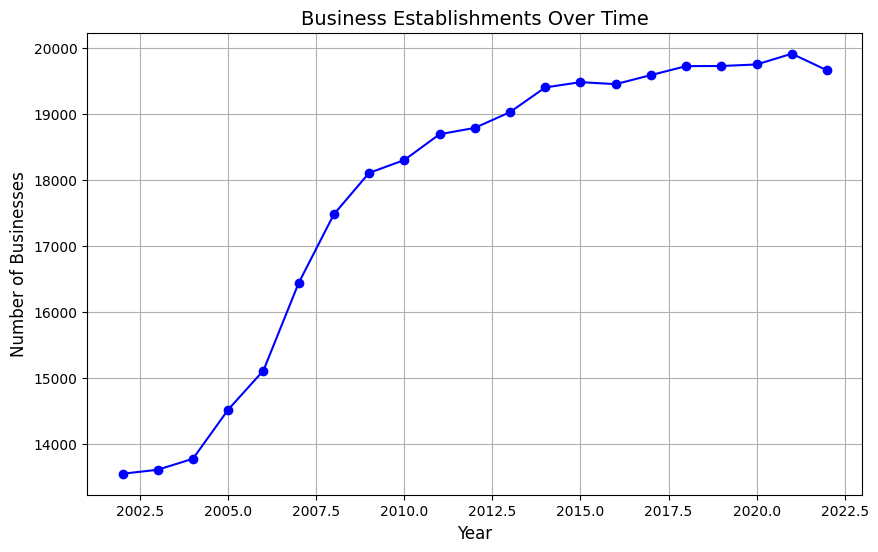

In [ ]:
import matplotlib.pyplot as plt

# Group data by census_year and count the number of businesses established each year
business_trend = df.groupby('census_year')['trading_name'].count().reset_index()

# Plot the trend over time
plt.figure(figsize=(10, 6))  # Adjust the figure size for better clarity
plt.plot(business_trend['census_year'], business_trend['trading_name'], marker='o', linestyle='-', color='b')

# Add title and labels
plt.title('Business Establishments Over Time', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of Businesses', fontsize=12)

# Show the plot
plt.grid(True)  # Add gridlines for readability
plt.show()


<p class="usecase-subsection-header">3. Industry Analysis</p>

<p class="usecase-subsection-blurb"><strong>Objective:</strong> Analyze the concentration of different industries (<code>industry_anzsic4_description</code>).</p>

<p class="usecase-subsection-blurb"><strong>Approach:</strong> Use the <code>industry_anzsic4_description</code> column to see which industries are dominant in certain geographic areas or time periods.</p>

<p class="usecase-subsection-blurb"><strong>What to do:</strong></p>
<ul>
    <li><strong>Top industries:</strong> Find the top industries by counting the occurrences of each industry type.</li>
    <li><strong>Industry hotspots:</strong> Combine geographic data with industry information to highlight specific areas where certain industries are more prevalent.</li>
</ul>

In [ ]:
import pandas as pd

# Assuming df is already loaded and contains the columns 'industry_anzsic4_description' and 'clue_small_area'

# 1. Top 5 industries by frequency in the dataset
top_industries = df['industry_anzsic4_description'].value_counts().head(5)
print("Top 5 Industries:\n", top_industries)

# 2. Industry hotspots: Grouping by area (clue_small_area) and industry to find prevalent industries in each area
industry_hotspots = df.groupby(['clue_small_area', 'industry_anzsic4_description']).size().reset_index(name='counts')

# Sorting to find the areas with the most prevalent industries
industry_hotspots_sorted = industry_hotspots.sort_values(by='counts', ascending=False)

# Display the top 10 industry hotspots
print("Top 10 Industry Hotspots:\n", industry_hotspots_sorted.head(10))

# Optional: Saving the industry hotspots to a CSV for further analysis
industry_hotspots_sorted.to_csv('industry_hotspots.csv', index=False)


Top 5 Industries:
 industry_anzsic4_description
Vacant Space                                   57392
Cafes and Restaurants                          29666
Legal Services                                 13415
Takeaway Food Services                         11304
Computer System Design and Related Services     9580
Name: count, dtype: int64
Top 10 Industry Hotspots:
       clue_small_area                     industry_anzsic4_description  counts
1232  Melbourne (CBD)                                     Vacant Space   27689
921   Melbourne (CBD)                            Cafes and Restaurants   17570
1038  Melbourne (CBD)                                   Legal Services   11702
1222  Melbourne (CBD)                           Takeaway Food Services    7440
1089  Melbourne (CBD)  Other Auxiliary Finance and Investment Services    7269
476         Docklands                                     Vacant Space    6793
1048  Melbourne (CBD)  Management Advice and Other Consulting Services    6490
94

<p class="usecase-subsection-header">Proximity Analysis (Distance to Competitors or Key Locations)</p>

<p class="usecase-subsection-blurb"><strong>Objective:</strong> Analyze how proximity to competitors, transportation hubs, or key business districts affects business success.</p>

<p class="usecase-subsection-blurb"><strong>Approach:</strong> Calculate the distance between businesses or specific geographic landmarks (e.g., train stations, shopping centers) and analyze the impact on business performance.</p>

<p class="usecase-subsection-blurb"><strong>What to do:</strong></p>
<ul>
    <li><strong>Distance to key locations:</strong> Use the <code>geopy</code> library to calculate the distance between businesses and key landmarks.</li>
    <li><strong>Impact on success:</strong> Analyze how distance from these landmarks affects business success rates.</li>
</ul>




In [ ]:
import pandas as pd
from geopy.distance import geodesic

# List of key locations (e.g., transportation hubs and important landmarks)
key_locations = [
    (-37.8182711, 144.9670618),  # Flinders Street Station
    (-37.8077867, 144.9624251),  # Southern Cross Station
    (-37.814, 144.96332),        # Melbourne City Central
    (-37.81197, 144.97316),      # Parliament Station
    (-37.81149, 144.95436),      # Flagstaff Station
]

# Function to calculate the distance from a business to the nearest key location
def calculate_nearest_location(lat, lon, locations):
    distances = [geodesic((lat, lon), location).km for location in locations]
    return min(distances)

# Filter out rows with missing latitude or longitude
df_filtered = df.dropna(subset=['latitude', 'longitude'])

# Ensure that latitude and longitude columns are available in the filtered dataset
if 'latitude' in df_filtered.columns and 'longitude' in df_filtered.columns:
    # Calculate the distance to the nearest key location for each business
    df_filtered['distance_to_nearest_key_location'] = df_filtered.apply(
        lambda row: calculate_nearest_location(row['latitude'], row['longitude'], key_locations), axis=1
    )

    # Analyze proximity by geographic area or industry (or other metrics)
    proximity_analysis_by_area = df_filtered.groupby('clue_small_area')['distance_to_nearest_key_location'].mean().reset_index()
    proximity_analysis_by_industry = df_filtered.groupby('industry_anzsic4_description')['distance_to_nearest_key_location'].mean().reset_index()

    # Display results
    print("Proximity Analysis by Geographic Area:")
    print(proximity_analysis_by_area.head())

    print("\nProximity Analysis by Industry:")
    print(proximity_analysis_by_industry.head())
else:
    print("'latitude' and 'longitude' columns are missing from the dataset.")


Proximity Analysis by Geographic Area:
   clue_small_area  distance_to_nearest_key_location
0          Carlton                          0.857704
1        Docklands                          1.159365
2   East Melbourne                          0.833543
3       Kensington                          3.072435
4  Melbourne (CBD)                          0.339598

Proximity Analysis by Industry:
                  industry_anzsic4_description  \
0                                Accommodation   
1                          Accounting Services   
2  Adult, Community and Other Education n.e.c.   
3                         Advertising Services   
4               Aged Care Residential Services   

   distance_to_nearest_key_location  
0                          0.818983  
1                          0.633597  
2                          0.580261  
3                          1.015940  
4                          2.438420  


<ipython-input-9-deae4741e32f>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['distance_to_nearest_key_location'] = df_filtered.apply(


<p class="usecase-subsection-header">Business Location Analysis for Carlton, Flinders Street, and Chapel Street</p>

<p class="usecase-subsection-blurb"><strong>User Story:</strong> As a business entrepreneur, I want to identify the most suitable location to start my business in Melbourne. I am particularly interested in understanding the business landscape and industry distribution near Carlton, Flinders Street, and Chapel Street. This analysis will help me determine which area offers the best opportunity based on proximity to key business districts and competitors.</p>

<p class="usecase-subsection-blurb"><strong>Objective:</strong> Analyze the business environment within 3 km of Carlton, Flinders Street, and Chapel Street, focusing on industry distribution and business concentration.</p>

<p class="usecase-subsection-blurb"><strong>Approach:</strong></p>
<ul>
    <li>Use the geographic coordinates of Carlton, Flinders Street, and Chapel Street to calculate distances from each business in the dataset.</li>
    <li>Filter businesses located within a 3 km radius of each location.</li>
    <li>Analyze the distribution of industries in each area to identify the top business sectors.</li>
    <li>Compare the business density and diversity across Carlton, Flinders Street, and Chapel Street to help the entrepreneur make an informed decision.</li>
</ul>

<p class="usecase-subsection-blurb"><strong>Steps:</strong></p>
<ul>
    <li><strong>Step 1:</strong> Extract business data for all locations in Melbourne using the Melbourne Open Data API.</li>
    <li><strong>Step 2:</strong> Define the geographic coordinates for Carlton, Flinders Street, and Chapel Street:</li>
    <ul>
        <li><strong>Carlton:</strong> Latitude: -37.800, Longitude: 144.966</li>
        <li><strong>Flinders Street:</strong> Latitude: -37.8182711, Longitude: 144.9670618</li>
        <li><strong>Chapel Street:</strong> Latitude: -37.8517106, Longitude: 144.9939362</li>
    </ul>
    <li><strong>Step 3:</strong> Calculate the distance from each business to the selected locations using the geodesic distance calculation (using the <code>geopy</code> library).</li>
    <li><strong>Step 4:</strong> Filter the businesses within a 3 km radius of each location (Carlton, Flinders Street, and Chapel Street).</li>
    <li><strong>Step 5:</strong> Analyze the industry distribution by grouping businesses by industry code and description.</li>
    <li><strong>Step 6:</strong> Visualize the industry distribution for each location, comparing the top 10 industries for businesses in Carlton, Flinders Street, and Chapel Street.</li>
</ul>


The dataset contains 374210 records.
   census_year  block_id  property_id  base_property_id clue_small_area  \
0         2017       266       109851            109851         Carlton   
1         2017       266       109851            109851         Carlton   
2         2017       266       534003            534003         Carlton   
3         2017       266       664003            664003         Carlton   
4         2017       266       664005            664005         Carlton   

                   trading_name                          business_address  \
0  Metropoli's Research Pty Ltd  Level 1, 74 Victoria Street CARLTON 3053   
1             J Hong Restaurant  Ground , 74 Victoria Street CARLTON 3053   
2                  St2 Expresso           70 Victoria Street CARLTON 3053   
3            RMIT Resources Ltd           20 Cardigan Street CARLTON 3053   
4                        vacant           24 Cardigan Street CARLTON 3053   

   industry_anzsic4_code              industry_an

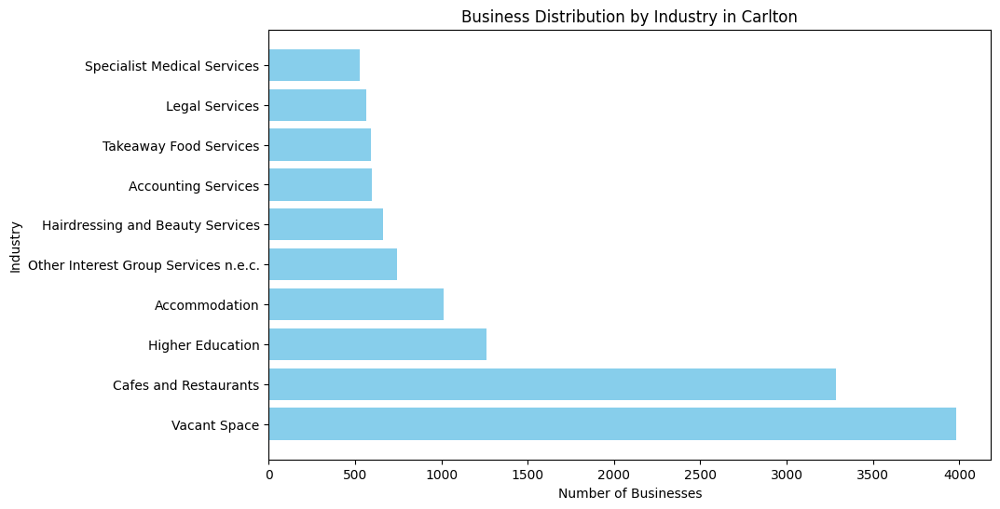

In [ ]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
from io import StringIO

# Step 1: Function to collect data from the Melbourne Open Data portal
def collect_data(dataset_id):
    base_url = 'https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
    dataset_id = dataset_id
    format = 'csv'

    url = f'{base_url}{dataset_id}/exports/{format}'
    params = {
        'select': '*',
        'limit': -1,  # Fetch all records
        'lang': 'en',
        'timezone': 'UTC',
    }

    # GET request
    response = requests.get(url, params=params)

    if response.status_code == 200:
        # Read the CSV content
        url_content = response.content.decode('utf-8')
        dataset = pd.read_csv(StringIO(url_content), delimiter=';')
        return dataset
    else:
        print(f'Request failed with status code {response.status_code}')
        return None

# Step 2: Set dataset_id for the API call
dataset_id = 'business-establishments-with-address-and-industry-classification'

# Step 3: Collect data and store in df
df = collect_data(dataset_id)

# Step 4: Proceed if data was loaded successfully
if df is not None:
    print(f'The dataset contains {len(df)} records.')
    print(df.head(5))  # Display the first 5 rows to inspect the data
else:
    print("Failed to retrieve data.")

# Step 5: Group by area and industry for distribution analysis
if 'clue_small_area' in df.columns and 'industry_anzsic4_description' in df.columns:
    size_distribution = df.groupby(['clue_small_area', 'industry_anzsic4_description']).size().reset_index(name='business_count')

    # Display the distribution
    print("Business Distribution by Area and Industry:\n", size_distribution)

    # Step 6: Visualization - Horizontal bar chart for a specific area
    plt.figure(figsize=(10, 6))
    area = 'Carlton'  # Example area
    area_data = size_distribution[size_distribution['clue_small_area'] == area]

    # Sort data to display the top industries first (optional)
    area_data = area_data.sort_values(by='business_count', ascending=False).head(10)  # Top 10 industries

    # Create a horizontal bar chart
    plt.barh(area_data['industry_anzsic4_description'], area_data['business_count'], color='skyblue')

    # Customize the plot
    plt.title(f'Business Distribution by Industry in {area}')
    plt.xlabel('Number of Businesses')
    plt.ylabel('Industry')
    plt.xticks(rotation=0)  # Ensure the x-axis labels are horizontal for readability

    # Show the chart
    plt.show()

else:
    print("Required columns ('clue_small_area' or 'industry_anzsic4_description') are missing.")


The dataset contains 374210 records.
   census_year  block_id  property_id  base_property_id clue_small_area  \
0         2017       266       109851            109851         Carlton   
1         2017       266       109851            109851         Carlton   
2         2017       266       534003            534003         Carlton   
3         2017       266       664003            664003         Carlton   
4         2017       266       664005            664005         Carlton   

                   trading_name                          business_address  \
0  Metropoli's Research Pty Ltd  Level 1, 74 Victoria Street CARLTON 3053   
1             J Hong Restaurant  Ground , 74 Victoria Street CARLTON 3053   
2                  St2 Expresso           70 Victoria Street CARLTON 3053   
3            RMIT Resources Ltd           20 Cardigan Street CARLTON 3053   
4                        vacant           24 Cardigan Street CARLTON 3053   

   industry_anzsic4_code              industry_an

<ipython-input-4-62cba8cc4648>:58: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['distance_from_flinders'] = df_cleaned.apply(calculate_distance, axis=1)


Industry Distribution for Businesses near Flinders Street:
                           industry_anzsic4_description  business_count
0                                        Accommodation            1796
1                                  Accounting Services            3077
2          Adult, Community and Other Education n.e.c.             680
3                                 Advertising Services             910
4                       Aged Care Residential Services              24
..                                                 ...             ...
356                          Womens Footwear Retailing             621
357  Wooden Furniture and Upholstered Seat Manufact...              16
358  Wooden Structural Fitting and Component Manufa...               6
359                                   Wool Wholesaling              18
360         Zoological and Botanical Gardens Operation              23

[361 rows x 2 columns]


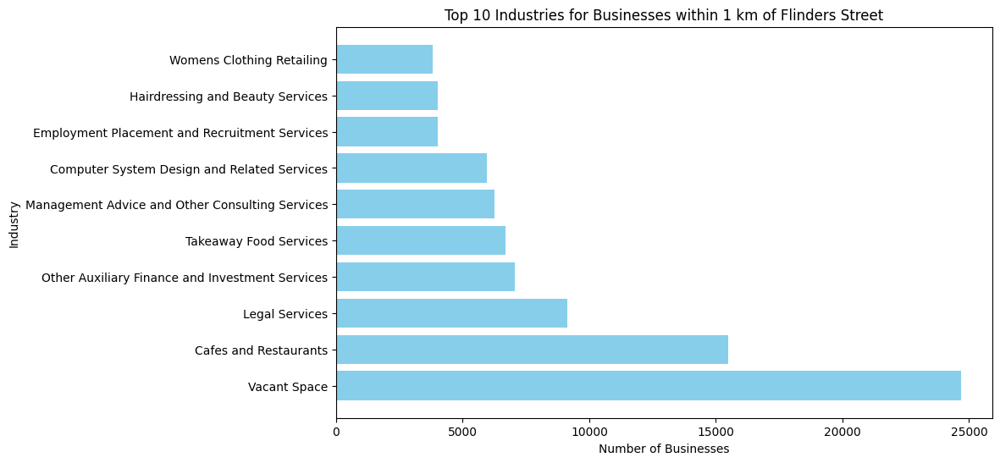

In [ ]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
from io import StringIO
from geopy.distance import geodesic

# Step 1: Function to collect data from the Melbourne Open Data portal
def collect_data(dataset_id):
    base_url = 'https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
    dataset_id = dataset_id
    format = 'csv'

    url = f'{base_url}{dataset_id}/exports/{format}'
    params = {
        'select': '*',
        'limit': -1,  # Fetch all records
        'lang': 'en',
        'timezone': 'UTC',
    }

    # GET request
    response = requests.get(url, params=params)

    if response.status_code == 200:
        # Read the CSV content
        url_content = response.content.decode('utf-8')
        dataset = pd.read_csv(StringIO(url_content), delimiter=';')
        return dataset
    else:
        print(f'Request failed with status code {response.status_code}')
        return None

# Step 2: Set dataset_id for the API call
dataset_id = 'business-establishments-with-address-and-industry-classification'

# Step 3: Collect data and store in df
df = collect_data(dataset_id)

# Step 4: Proceed if data was loaded successfully
if df is not None:
    print(f'The dataset contains {len(df)} records.')
    print(df.head(5))  # Display the first 5 rows to inspect the data
else:
    print("Failed to retrieve data.")

# Step 5: Define the Flinders Street coordinates (hard-coded)
flinders_street_coords = (-37.8182711, 144.9670618)  # Latitude and Longitude of Flinders Street

# Step 6: Function to calculate the distance from Flinders Street
def calculate_distance(row):
    business_coords = (row['latitude'], row['longitude'])
    return geodesic(business_coords, flinders_street_coords).km

# Step 7: Drop rows with missing latitude or longitude
df_cleaned = df.dropna(subset=['latitude', 'longitude'])

# Step 8: Apply the distance calculation to the cleaned dataset
df_cleaned['distance_from_flinders'] = df_cleaned.apply(calculate_distance, axis=1)

# Step 9: Filter businesses within 1 km of Flinders Street
df_near_flinders = df_cleaned[df_cleaned['distance_from_flinders'] <= 1]

# Step 10: Group by industry for businesses near Flinders Street
if 'industry_anzsic4_description' in df.columns:
    industry_distribution_flinders = df_near_flinders.groupby('industry_anzsic4_description').size().reset_index(name='business_count')

    # Display the distribution
    print("Industry Distribution for Businesses near Flinders Street:\n", industry_distribution_flinders)

    # Step 11: Visualization - Horizontal bar chart for industries near Flinders Street
    plt.figure(figsize=(10, 6))

    # Sort data to display the top industries first (optional)
    industry_distribution_flinders = industry_distribution_flinders.sort_values(by='business_count', ascending=False).head(10)  # Top 10 industries

    # Create a horizontal bar chart
    plt.barh(industry_distribution_flinders['industry_anzsic4_description'], industry_distribution_flinders['business_count'], color='skyblue')

    # Customize the plot
    plt.title('Top 10 Industries for Businesses within 1 km of Flinders Street')
    plt.xlabel('Number of Businesses')
    plt.ylabel('Industry')
    plt.xticks(rotation=0)  # Ensure the x-axis labels are horizontal for readability

    # Show the chart
    plt.show()

else:
    print("Required column 'industry_anzsic4_description' is missing.")


The dataset contains 374210 records.
   census_year  block_id  property_id  base_property_id clue_small_area  \
0         2017       266       109851            109851         Carlton   
1         2017       266       109851            109851         Carlton   
2         2017       266       534003            534003         Carlton   
3         2017       266       664003            664003         Carlton   
4         2017       266       664005            664005         Carlton   

                   trading_name                          business_address  \
0  Metropoli's Research Pty Ltd  Level 1, 74 Victoria Street CARLTON 3053   
1             J Hong Restaurant  Ground , 74 Victoria Street CARLTON 3053   
2                  St2 Expresso           70 Victoria Street CARLTON 3053   
3            RMIT Resources Ltd           20 Cardigan Street CARLTON 3053   
4                        vacant           24 Cardigan Street CARLTON 3053   

   industry_anzsic4_code              industry_an

<ipython-input-6-68c0ec4b7f21>:58: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['distance_from_chapel'] = df_cleaned.apply(calculate_distance, axis=1)


Industry Distribution for Businesses near Chapel Street:
                     industry_anzsic4_description  business_count
0                                  Accommodation             167
1                            Accounting Services             150
2    Adult, Community and Other Education n.e.c.              20
3                           Advertising Services             123
4                 Aged Care Residential Services              31
..                                           ...             ...
181        Waste Treatment and Disposal Services               3
182                      Water Freight Transport              22
183   Wired Telecommunications Network Operation              26
184                    Womens Clothing Retailing               2
185   Zoological and Botanical Gardens Operation              50

[186 rows x 2 columns]


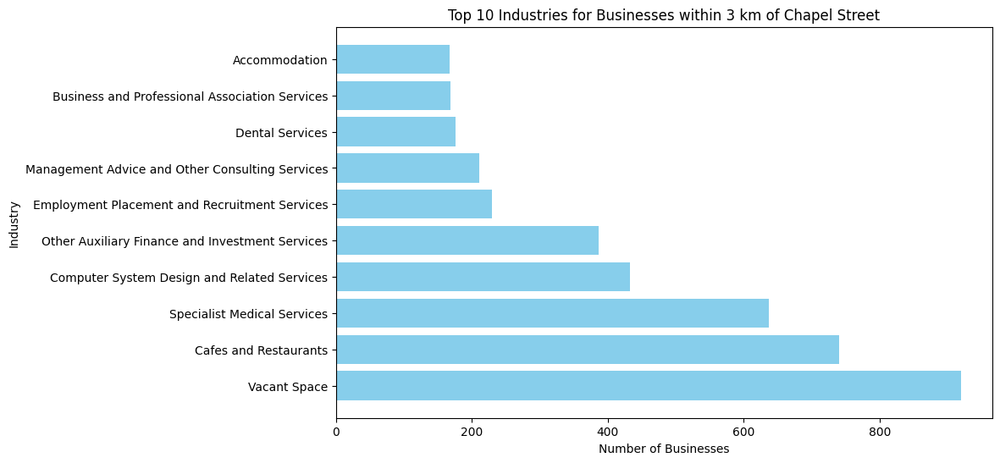

In [ ]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
from io import StringIO
from geopy.distance import geodesic

# Step 1: Function to collect data from the Melbourne Open Data portal
def collect_data(dataset_id):
    base_url = 'https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
    dataset_id = dataset_id
    format = 'csv'

    url = f'{base_url}{dataset_id}/exports/{format}'
    params = {
        'select': '*',
        'limit': -1,  # Fetch all records
        'lang': 'en',
        'timezone': 'UTC',
    }

    # GET request
    response = requests.get(url, params=params)

    if response.status_code == 200:
        # Read the CSV content
        url_content = response.content.decode('utf-8')
        dataset = pd.read_csv(StringIO(url_content), delimiter=';')
        return dataset
    else:
        print(f'Request failed with status code {response.status_code}')
        return None

# Step 2: Set dataset_id for the API call
dataset_id = 'business-establishments-with-address-and-industry-classification'

# Step 3: Collect data and store in df
df = collect_data(dataset_id)

# Step 4: Proceed if data was loaded successfully
if df is not None:
    print(f'The dataset contains {len(df)} records.')
    print(df.head(5))  # Display the first 5 rows to inspect the data
else:
    print("Failed to retrieve data.")

# Step 5: Define the Chapel Street coordinates (hard-coded)
chapel_street_coords = (-37.8517106, 144.9939362)  # Latitude and Longitude of Chapel Street

# Step 6: Function to calculate the distance from Chapel Street
def calculate_distance(row):
    business_coords = (row['latitude'], row['longitude'])
    return geodesic(business_coords, chapel_street_coords).km

# Step 7: Drop rows with missing latitude or longitude
df_cleaned = df.dropna(subset=['latitude', 'longitude'])

# Step 8: Apply the distance calculation to the cleaned dataset
df_cleaned['distance_from_chapel'] = df_cleaned.apply(calculate_distance, axis=1)

# Step 9: Filter businesses within 3 km of Chapel Street
df_near_chapel = df_cleaned[df_cleaned['distance_from_chapel'] <= 3]

# Step 10: Group by industry for businesses near Chapel Street
if 'industry_anzsic4_description' in df.columns:
    industry_distribution_chapel = df_near_chapel.groupby('industry_anzsic4_description').size().reset_index(name='business_count')

    # Display the distribution
    print("Industry Distribution for Businesses near Chapel Street:\n", industry_distribution_chapel)

    # Step 11: Visualization - Horizontal bar chart for industries near Chapel Street
    plt.figure(figsize=(10, 6))

    # Sort data to display the top industries first (optional)
    industry_distribution_chapel = industry_distribution_chapel.sort_values(by='business_count', ascending=False).head(10)  # Top 10 industries

    # Create a horizontal bar chart
    plt.barh(industry_distribution_chapel['industry_anzsic4_description'], industry_distribution_chapel['business_count'], color='skyblue')

    # Customize the plot
    plt.title('Top 10 Industries for Businesses within 3 km of Chapel Street')
    plt.xlabel('Number of Businesses')
    plt.ylabel('Industry')
    plt.xticks(rotation=0)  # Ensure the x-axis labels are horizontal for readability

    # Show the chart
    plt.show()

else:
    print("Required column 'industry_anzsic4_description' is missing.")
